

## Deliverables
1. [Script to load and clean data](#script)
3. [Report on signs of money laundering](#report)

## Workflow
1. [Load data](#load)
2. Inspect and clean data as you go  
    2.1. [Get basic information about data](#basic)  
    2.2. Check for [missing values](#missing), [extreme values](#extreme), [duplicate values](#dupes)  
    2.3. [Validate against "vendor" provided info to make sure we're working with the same data](#vendor)
3. [Explore data for signs of money laundering](#aml)

<a id='script'></a>
# D1. Script to load and clean data

**Quality Issues Handled by cleaning script**
1. Type conversions (amount_eur, date)
2. Deduplication of records where two core entities are involved


**Quality Issues Unaddressed by cleaning script**
1. The same account number can have multiple names, even when normalized
2. There are discrepancies between the .json file and the .db file


In [2]:
import json
import pandas as pd
import string 
import re

ninja = True
try:
    import wordninja
except ImportError:
    print('Wordninja module not found')
    ninja = False

def dollar_str_to_num(dollar):
    '''Removes all "$" and "," from money string and convert to float '''
    try:
        return float(dollar.replace('$', '').replace(',',''))
    except AttributeError:
        if isinstance(dollar, float):
            return dollar

def extract_purpose_types(purpose):
    """ Assign one of 7 categories based on hard coded keywords
    purpose: str, description of purpose in upper case
    """
    s = purpose.replace(' ', '') # remove spaces within word 
    types = []
    if re.search(RE_CONTRACT, s):
        types.append('Contract')
    if re.search(RE_INVOICE, s):
        types.append('Invoice')
    if re.search(RE_RETURN, s):
        types.append('Return')
    if re.search(RE_GROUP_PAYMENT, s):
        types.append('Group_Payment')
    if re.search(RE_FEE, s):
        types.append('Fee')
    if re.search(RE_LOAN_AGREEMENT, s):
        types.append('Loan_agreement')
    return tuple(types)   

# Purpose Type
RE_CONTRACT = r'CONTRACT|CINTRACT|CONTRAKT'
RE_INVOICE = r'INVOICE|INV|INVOCE'
RE_RETURN = r'RTN|RETURN'
RE_GROUP_PAYMENT = r'GROUP PAYMENT'
RE_FEE = r'FEE'
RE_LOAN_AGREEMENT = r'DOGOVOR ZAYMA'
# Invoice number
RE_INVOICE_NUM = r'(\d{16})'



# Loading a dataframe, df from dkdata.json 

with open('./dkdata.json', 'rb') as j:
    raw = json.load(j)

df = pd.DataFrame(raw['data'])

# Basic cleanup # 

# Convert str amount_eur to numeric datatype by applying function
df['amount_eur'] = df['amount_eur'].map(dollar_str_to_num)

# Take the absolute value of amount_orig because the sign is from amount_orig 
# being the balance change from the perspective of the core entity participating
df['amount_orig'] = abs(df['amount_orig'])

# Convert date from string to datetime for extracting time features if needed
df['date'] = pd.to_datetime(df['date'])

# Upper case for consistency  
df['purpose'] = df['purpose'].str.upper()

# Deduplication - Duplicate records when two core entities are involved 
df['invoice_num'] = df['purpose'].str.extract(RE_INVOICE_NUM)[0]
dupe_mask = df.duplicated(subset=['payer_name_norm'
                                , 'beneficiary_name_norm'
                                , 'amount_eur'
                                , 'date'
                                , 'invoice_num'], keep='first')
dedupe_df = df[~dupe_mask]

# Feature Extraction # 

# extract type     
dedupe_df['purpose_type'] = dedupe_df['purpose'].map(extract_purpose_types)

# remove symbols, numbers and spaces 
translate_table = dict((ord(char), '') for char in string.punctuation + string.digits)
RE_PURPOSE = re.compile(r'FOR (.+)') # capture anything following a 'FOR ' 

# results in one continuous string of word characters
dedupe_df['purpose_for'] = dedupe_df['purpose'].str.translate(translate_table)\
                                 .str.strip()\
                                 .str.extract(RE_PURPOSE)[0]\
                                 .str.replace(' ', '') # remove spaces within word 
# break up words again for ease of reading
# df.loc[df['purpose_for'].notna(), 'purpose_for'].map(lambda x: ' '.join(wordninja.split(x)))

/home/douglas/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:87: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/douglas/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:94: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


In [3]:
import pandas as pd 
import numpy as np
import json
import datetime

import plotly as py
import plotly.express as px
import plotly.graph_objects as go

pd.set_option('max_colwidth', -1)

<a id='report'></a>
# D2. Money laundering report
Yes, there is evidence of money laundering occurring within the bank as there is a variety of irregular transactions.   

Note: Run all cells below [Workflow](#workflow) first to ensure report cells run properly. 

# D2.1. [Missing values](#missing)  
- 2.1.1. All rows with missing values involve one of four companies: ('METASTAR INVEST LLP', 'LCM ALLIANCE LLP', 'POLUX MANAGEMENT LP', 'HILUX SERVICES LP')  

In [4]:
vc = df.loc[df['payer_account'].isna(), 'beneficiary_name_norm'].value_counts().reset_index()

In [5]:
vc = vc.rename(columns={'index':'Beneficiary Name Norm', 'beneficiary_name_norm':'Count'})

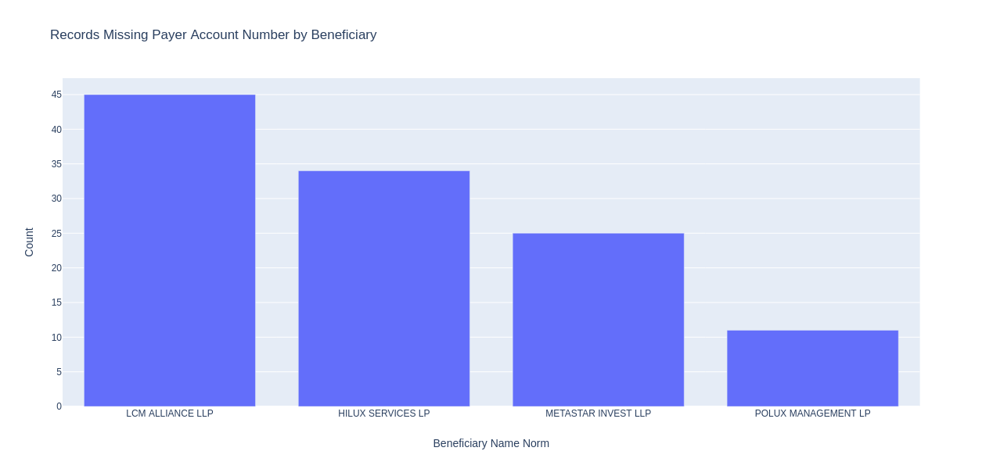

In [6]:
fig = px.bar(vc, x='Beneficiary Name Norm', y='Count', title='Records Missing Payer Account Number by Beneficiary')
fig.show()

- 2.1.2 From glancing at these rows, it appears that returns is commonly cited as the purpose of these transactions 

In [7]:
display(df.loc[df['payer_account'].isna(), ['beneficiary_name_norm', 'payer_name_norm', 'purpose']].head().T)

,67,121,308,451,509
beneficiary_name_norm,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP
payer_name_norm,DEUTDEFFXXX,BKCHCNBJ,DEUTDEFFXXX,DENITRIS,TDOMUS33
purpose,"1207185100280220 RTN 1207135025890645/7033/ 132,795.00 E UR/345587 INMAXO CAPITAL CORP.",1207245104516412 345587 INMAXO CAPITAL CORP./RTN P/O 12 07055022671163/USD 50000./INVALID PURPOSE OF PMNT,1208095105222495 RETURN OF P/O 159/1207305022879760 /EU R66936.48/BENEFICIARY STATES THAT FUNDS TRANSFERRED BY MISTAKE,1208275104667672 RTN P/O 1207265020271628/132/ USD 3700 0./PER YR REQUEST,1208305106394756 RTN P/O 1208225027994320/301/ PER YR R EQUEST


## D2.2 [Repeated transaction amounts](#aml) 
- horizontal clusters in scatter plot of date vs transaction amounts, indicating repeated values that occur within a short period of time

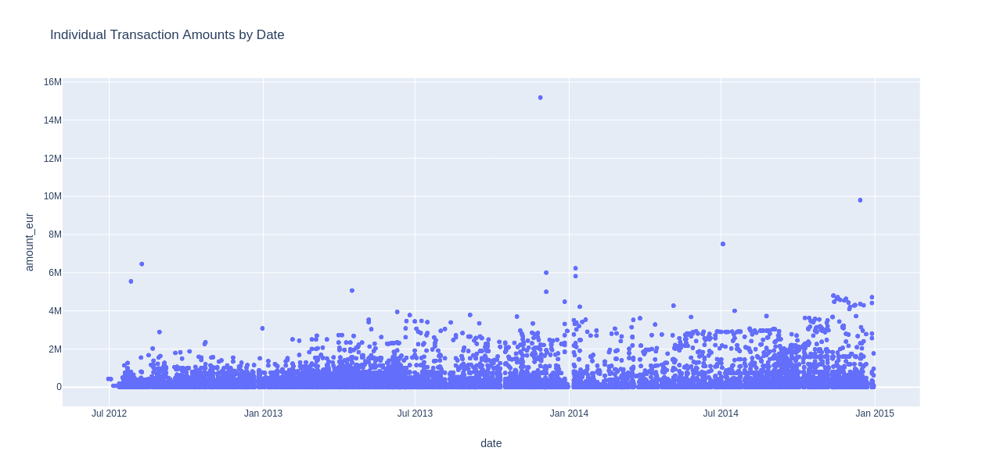

In [8]:
px.scatter(dedupe_df, x='date', y='amount_eur', hover_data=['amount_orig_currency', 'payer_bank_country', 'payer_name']
          , title='Individual Transaction Amounts by Date')
# Get a sense of the transaction amount by date

The Securo 15mm stands out above the rest when plotting everything. If you zoom in to the 0 - 1mm range, you notice some horizontal clusters of points, which indicate repeated values that occur within a short period of time. Counting the number of occurences of transaction amounts gives you the most frequent amounts overall, but even more compelling are the visual clusters. 

In [9]:
dedupe_df.dropna().groupby('amount_eur')['id'].count().sort_values(ascending=False).head(10)

amount_eur
20000.0     47
30000.0     32
10000.0     31
50000.0     29
100000.0    26
36918.5     24
200000.0    24
500000.0    23
300000.0    21
25000.0     20
Name: id, dtype: int64

Here's one cluster I noticed where the transaction amount is 369185 euros. Polux and Hilux paid out a convenient 500k USD to a mixture of companies, making payments in quick succession sometimes to the same beneficiary, and only in the month of November 2013. 

In [10]:
show_cols = ['id', 'date', 'amount_eur', 'amount_orig', 'beneficiary_name_norm', 'payer_name_norm', 'purpose']

In [11]:
dedupe_df.loc[dedupe_df['amount_eur'] == 369185, show_cols].T # 500k usd

,11161,11190,11254,11297,11341,11566,11599,11600,11717
id,16932,13643,63,13670,1535,1580,1983,13761,1621
date,2013-11-05 00:00:00,2013-11-06 00:00:00,2013-11-08 00:00:00,2013-11-12 00:00:00,2013-11-13 00:00:00,2013-11-22 00:00:00,2013-11-25 00:00:00,2013-11-25 00:00:00,2013-11-29 00:00:00
amount_eur,369185,369185,369185,369185,369185,369185,369185,369185,369185
amount_orig,500000,500000,500000,500000,500000,500000,500000,500000,500000
beneficiary_name_norm,UPFIELD EXPRESS INC,UPFIELD EXPRESS INC,KG COMMERCE LLP,MOLONEY TRADE LLP,AGRO-TECHNIC LLC,DATEMILE ALLIANCE LLP,ILHAM IBRAHIMOV,ILHAM IBRAHIMOV,POLUX MANAGEMENT LP
payer_name_norm,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,HILUX SERVICES LP,HILUX SERVICES LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,HILUX SERVICES LP
purpose,1311055031441781 PAYMENT TO THE CONTRACT N 5 DD. 07. 06. 2013 FOR CONSTRUCTION MATERIALS.,1311065032663907 PAYMENT TO THE CONTRACT N 5 DD. 07.06.2 013 FOR CONSTRUCTION MATERIALS.,1311085071488703 PAYMENT TO THE CONTRACT N 4 DD.11.06.20 13,1311125072275918 PAYMENT TO THE CONTRACT N 003 DD.30.05. 2013 FOR EQUIPMENT.,1311135027215440 PAYMENT TO THE CONTRACT N.20/2013 D D.2 3.04.2013 FOR EQUIPMENT.,1311225074459438 PAYMENT TO THE CONTRACT N 55 DD 31.05.2 013 FOR EQUIPMENT.,1311255025206909 PAYMENT TO THE CONTRACT N 443 DD.08 .11 .2013 FOR EQUIPMENT.,1311255026413837 PAYMENT TO THE CONTRACT N 443 DD.08 .11 .2013 FOR EQUIPMENT.,1311295073990769 PAYMENT TO THE CONTRACT N 12 DD 03.06.2 013 FOR EQUIPMENT.


## D2.3 [Short time between transactions](#time)

In [103]:
# 5th percentile 
np.percentile(pairs['time_between_trans'].dropna(), 5)

1.0

In [104]:
pairs[pairs['time_between_trans'] < 1].head(10)

,beneficiary_name_norm,payer_name_norm,avg_amount_eur,num_trans,time_between_trans
433,BONINVEST LLP,LCM ALLIANCE LLP,2.790242e+05,186,0.891892
1543,ILHAM IBRAHIMOV,POLUX MANAGEMENT LP,5.611612e+05,10,0.888889
2978,POLUX MANAGEMENT LP,SDT TRADE LLP,1.443763e+06,5,0.500000
3188,SANDLER EXPERT LIMITED,POLUX MANAGEMENT LP,7.570010e+05,3,0.000000
3147,S+H BAUBETREUUNGS GMBH,METASTAR INVEST LLP,2.363333e+04,3,0.500000
1259,GR BERATUNG GMBH,LCM ALLIANCE LLP,6.716667e+02,3,0.000000
691,CORTEM GROUP,LCM ALLIANCE LLP,1.384949e+04,3,0.000000
2537,MM ORBITA LTD LLC,LCM ALLIANCE LLP,5.851293e+05,3,0.000000
3754,VIDENTI,METASTAR INVEST LLP,2.899833e+02,3,0.000000
1633,INTERNATIONAL COMMUNITY SCHOOL ICS,POLUX MANAGEMENT LP,1.251490e+03,2,0.000000


In [105]:
# Buying mercedes benz example - 3 payments in 2 days
pair_trans_details(dedupe_df, 'S+H BAUBETREUUNGS GMBH', 'METASTAR INVEST LLP').loc[show_cols]

,9819,9871,9872
id,15525,15526,10496
date,2013-08-28 00:00:00,2013-08-29 00:00:00,2013-08-29 00:00:00
amount_eur,15000,28000,27900
amount_orig,-15000,-28000,-27900
beneficiary_name_norm,S+H BAUBETREUUNGS GMBH,S+H BAUBETREUUNGS GMBH,S+H BAUBETREUUNGS GMBH
payer_name_norm,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP
purpose,1308285034887444 FINANZIERUNGSKONDITIONEN FUR EINEN MERC EDES-BENZ S350 GEBRAUCHTWAGEN DD 20.08.13,1308295030669322 FINANZIERUNGSKONDITIONEN FUR EINEN MERC EDES-BENZ S350 GEBRAUCHTWAGEN DD 20.08.13 RESUL.O.,"1308295035255274 INVOICE N 13020 DD 22.07.2013 MERCEDES- BENZ E200 CGI,SCHWARZ,FZG IDENT N WDD2120481A712070 LEYL A .O."


## D2.4 [Large amounts of money moved at short time intervals between two companies](#amount)

In [106]:
# 95th percetile of transactions are under 450k euros
np.percentile(pairs['avg_amount_eur'], 95)

453199.2750233643

In [107]:
# but these are in the millions 
pairs[pairs['num_trans'] > 1].sort_values('avg_amount_eur', ascending=False).head()

,beneficiary_name_norm,payer_name_norm,avg_amount_eur,num_trans,time_between_trans
1399,HILUX SERVICES LP,ARASH MEDICAL PRODUCTION LTD,3.752200e+06,5,84.000000
2133,LCM ALLIANCE LLP,ZAMANTINI LIMITED,2.200968e+06,5,22.250000
1400,HILUX SERVICES LP,BAKTELEKOM MMC,2.147843e+06,437,1.314220
153,AMBERLOT INVEST LP,HILUX SERVICES LP,2.100000e+06,3,1.000000
2966,POLUX MANAGEMENT LP,BAKTELEKOM MMC,1.727983e+06,93,1.913043


In [108]:
# high value transactions example
pair_trans_details(dedupe_df, 'POLUX MANAGEMENT LP', 'BAKTELEKOM MMC')

,7012,7296,7384,7451,7453,7634,7721,7804,7809,8001,...,11290,11291,11332,11334,11356,11381,11481,11507,11636,11666
amount_eur,163160,1.84555e+06,1.12155e+06,1.49414e+06,2.349e+06,2.30935e+06,620144,404870,1.15465e+06,770987,...,1.0861e+06,1.99356e+06,199320,1.6635e+06,149853,609850,3.33665e+06,2.01497e+06,2.61822e+06,641600
amount_orig,211952,2.39744e+06,1.45694e+06,1.94094e+06,3.05144e+06,2.99994e+06,805592,525942,1.49994e+06,1.00154e+06,...,1.47094e+06,2.69994e+06,269946,2.25294e+06,202952,825942,4.51894e+06,2.72894e+06,3.54594e+06,868942
amount_orig_currency,USD,USD,USD,USD,USD,USD,USD,USD,USD,USD,...,USD,USD,USD,USD,USD,USD,USD,USD,USD,USD
amount_usd,211952,2397442,1456942,1940942,3051442,2999942,805592,525942,1499942,1001542,...,1470942,2699942,269947,2252942,202952,825942,4518942,2728942,3545942,868942
beneficiary_account,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,...,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009
beneficiary_bank_country,EE,EE,EE,EE,EE,EE,EE,EE,EE,EE,...,EE,EE,EE,EE,EE,EE,EE,EE,EE,EE
beneficiary_core,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
beneficiary_jurisdiction,GB,GB,GB,GB,GB,GB,GB,GB,GB,GB,...,GB,GB,GB,GB,GB,GB,GB,GB,GB,GB
beneficiary_name,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,...,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP
beneficiary_name_norm,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,...,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP


In [109]:
np.percentile(pairs['avg_amount_eur'], 95)

453199.2750233643

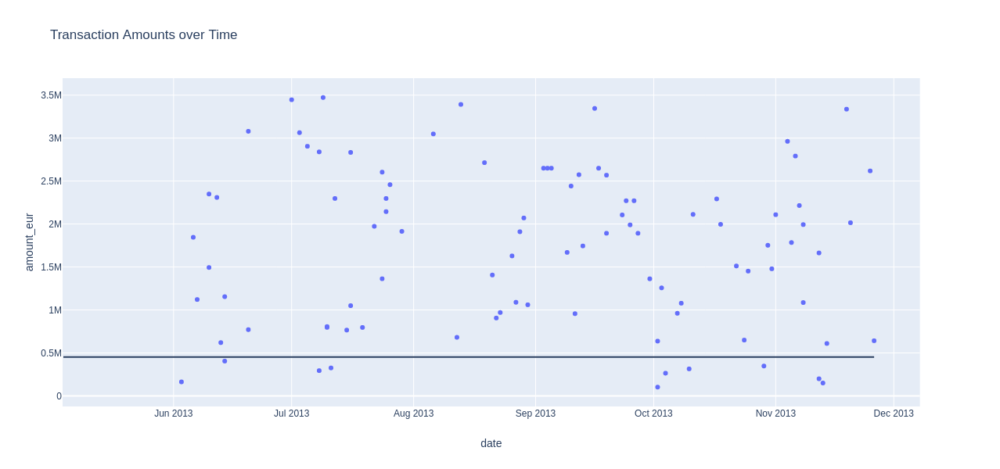

In [110]:
polux_baktele = pair_trans_details(dedupe_df, 'POLUX MANAGEMENT LP', 'BAKTELEKOM MMC').T
fig = px.scatter(polux_baktele, x='date', y='amount_eur'
              , title='Transaction Amounts over Time')
fig.layout.update({'shapes': [{'type': 'line',
                             'x0': polux_baktele['date'].min() - datetime.timedelta(days=30),
                             'y0': np.percentile(pairs['avg_amount_eur'], 95)
                             , 'x1':polux_baktele['date'].max()
                             , 'y1': np.percentile(pairs['avg_amount_eur'], 95)}]})
# fig.add_scatter(x=polux_baktele['date'], y= np.repeat(np.percentile(pairs['avg_amount_eur'], 95), len(polux_baktele)), connectgaps=True)
fig.show()

Nearly all transactions between this pair are above the 95th percentile. Does this pair of entities have good reason to be transferring funds so frequently at such high quantities?

# D2.5 Conclusion
There are a number of signs of money laundering. We would recommend checking whether the suspicious accounts have a valid reason for their behavior and generalizing these findings to create monitoring rules to flag other transactions. 

-----------------------------------

<a id='workflow'></a>
# W0: Imports

In [13]:
import pandas as pd 
import numpy as np
import json


import plotly as py
import plotly.express as px
import plotly.graph_objects as go

pd.set_option('max_colwidth', -1)

<a id='load'></a>
# W1: Load and clean data

In [14]:
with open('./dkdata.json', 'rb') as j:
    raw = json.load(j)

Data is a list of dicts stored under the 'data' key
```py
{'data': [{'amount_eur': '$431,762.31',
   'amount_orig': 535470.0,
   'amount_orig_currency': 'USD',
   'amount_usd': 535470,
   ...,}, 
   {...}]}
```

In [15]:
df = pd.DataFrame(raw['data'])

<a id='basic'></a>
# W2.1 Basic info

In [16]:
# Get number of rows and columns in data
df.shape

(16940, 23)

In [17]:
df.head().T

,0,1,2,3,4
amount_eur,"$431,762.31","$423,688.44","$71,698.53","$71,686.50",$47.52
amount_orig,535470,-535000,90535.2,-90520,-60
amount_orig_currency,USD,USD,USD,USD,USD
amount_usd,535470,535000,90536,90520,60
beneficiary_account,EE27 3300 3335 0561 0002,333504500003,EE77 3300 3334 8704 0004,333455870002,333455870002
beneficiary_bank_country,EE,33,EE,33,33
beneficiary_core,True,False,True,False,False
beneficiary_jurisdiction,GB,GB,GB,VG,VG
beneficiary_name,LCM ALLIANCE LLP,MOBILA LLP,METASTAR INVEST LLP,INMAXO CAPITAL CORP,INMAXO CAPITAL CORP
beneficiary_name_norm,LCM ALLIANCE LLP,MOBILA LLP,METASTAR INVEST LLP,INMAXO CAPITAL CORP.,INMAXO CAPITAL CORP.


In [18]:
df.dtypes
# From this, we see some of the type conversions needed
# For example amount_eur requires removing '$' and converting from str to float
# date should be converted from str to date

amount_eur                  object 
amount_orig                 float64
amount_orig_currency        object 
amount_usd                  int64  
beneficiary_account         object 
beneficiary_bank_country    object 
beneficiary_core            bool   
beneficiary_jurisdiction    object 
beneficiary_name            object 
beneficiary_name_norm       object 
beneficiary_type            object 
date                        object 
id                          int64  
investigation               object 
payer_account               object 
payer_bank_country          object 
payer_core                  bool   
payer_jurisdiction          object 
payer_name                  object 
payer_name_norm             object 
payer_type                  object 
purpose                     object 
source_file                 object 
dtype: object

In [19]:
# Convert amount_eur
def dollar_str_to_num(dollar):
    '''Removes all "$" and "," from money string and convert to float '''
    try:
        return float(dollar.replace('$', '').replace(',',''))
    except AttributeError:
        if isinstance(dollar, float):
            return dollar
        
df['amount_eur'] = df['amount_eur'].map(dollar_str_to_num)
df['amount_eur'].head()

0    431762.31
1    423688.44
2    71698.53 
3    71686.50 
4    47.52    
Name: amount_eur, dtype: float64

In [20]:
# Convert date from string
df['date'] = pd.to_datetime(df['date'])

In [21]:
df.nunique()
# More clues on whether column is a categorical or numeric or other

amount_eur                  10992
amount_orig                 8609 
amount_orig_currency        6    
amount_usd                  9247 
beneficiary_account         3435 
beneficiary_bank_country    147  
beneficiary_core            2    
beneficiary_jurisdiction    84   
beneficiary_name            3553 
beneficiary_name_norm       3185 
beneficiary_type            3    
date                        645  
id                          16940
investigation               1    
payer_account               368  
payer_bank_country          49   
payer_core                  2    
payer_jurisdiction          43   
payer_name                  437  
payer_name_norm             395  
payer_type                  3    
purpose                     15933
source_file                 6    
dtype: int64

In [22]:
# id can serve as a primary key for this dataset but it does not appear to be in any particular order
# while the data itself is ordered by date ascending
df[['id', 'date']].head()

,id,date
0,6049,2012-06-30
1,6050,2012-07-03
2,10623,2012-07-06
3,15589,2012-07-09
4,10624,2012-07-13


In [23]:
# data covers a 2.5 year time span
df['date'].describe()

count     16940              
unique    645                
top       2013-06-12 00:00:00
freq      114                
first     2012-06-30 00:00:00
last      2014-12-31 00:00:00
Name: date, dtype: object

In [24]:
# look at id = 1, no obvious pattern
df.loc[df['id'] == 1, ['id', 'date', 'amount_eur', 'beneficiary_name_norm', 'payer_name_norm']].T

,11278
id,1
date,2013-11-08 00:00:00
amount_eur,3691.85
beneficiary_name_norm,UMIT USLU
payer_name_norm,POLUX MANAGEMENT LP


# W2.2 Check for missing or unusual values

<a id='missing'></a>
### Missing values

In [25]:
# Count up the number of nulls within each column
df.isna().sum()

amount_eur                  0  
amount_orig                 0  
amount_orig_currency        0  
amount_usd                  0  
beneficiary_account         4  
beneficiary_bank_country    4  
beneficiary_core            0  
beneficiary_jurisdiction    0  
beneficiary_name            0  
beneficiary_name_norm       0  
beneficiary_type            0  
date                        0  
id                          0  
investigation               0  
payer_account               115
payer_bank_country          115
payer_core                  0  
payer_jurisdiction          0  
payer_name                  0  
payer_name_norm             0  
payer_type                  0  
purpose                     0  
source_file                 0  
dtype: int64

119 missing values account for why the dkdata.db only had 16821 rows, compared to 16940 in the json file.

In [26]:
# Filter to see rows where there are nulls in 'beneficiary_account'
df[df['beneficiary_account'].isna()].head().T

,306,3598,8782,11302
amount_eur,1468.05,2131.43,3301.41,186918
amount_orig,-1800,-2909.5,-4311,-253150
amount_orig_currency,USD,USD,USD,USD
amount_usd,1800,2910,4311,253150
beneficiary_account,None,None,None,None
beneficiary_bank_country,None,None,None,None
beneficiary_core,False,False,False,False
beneficiary_jurisdiction,UNKNOWN,UNKNOWN,UNKNOWN,US
beneficiary_name,CONTINENTAL ENGINES,MICROCOPY,MICROCOPY,TURBILLION LLC
beneficiary_name_norm,CONTINENTAL ENGINES,MICROCOPY,MICROCOPY,TURBILLION LLC


In [27]:
# Filter to see rows where there are nulls in 'payer_account'
df[df['payer_account'].isna()].head().T

,67,121,308,451,509
amount_eur,132789,39567.3,66871.3,30111.4,3262.34
amount_orig,132789,49962.5,66871.3,36920,4000
amount_orig_currency,EUR,USD,EUR,USD,USD
amount_usd,167676,49963,81992,36920,4000
beneficiary_account,EE77 3300 3334 8704 0004,EE77 3300 3334 8704 0004,EE77 3300 3334 8704 0004,EE77 3300 3334 8704 0004,EE77 3300 3334 8704 0004
beneficiary_bank_country,EE,EE,EE,EE,EE
beneficiary_core,True,True,True,True,True
beneficiary_jurisdiction,GB,GB,GB,GB,GB
beneficiary_name,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP
beneficiary_name_norm,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP


In [28]:
# All of the rows with missing payer account names  involve the core 4
df.loc[df['payer_account'].isna(), 'beneficiary_name_norm'].value_counts()

LCM ALLIANCE LLP       45
HILUX SERVICES LP      34
METASTAR INVEST LLP    25
POLUX MANAGEMENT LP    11
Name: beneficiary_name_norm, dtype: int64

In [29]:
df.loc[df['payer_account'].isna(), 'payer_type'].value_counts()

Company    61
Invalid    51
Person     3 
Name: payer_type, dtype: int64

Although the account number may be missing, there is still some information on the participant with missing account information and full information on the other participant. Dropping these rows would result in suspicious activity being hidden. 

In [30]:
# There's possibility of linking transactions by an identifying number in the purpose
df[df['purpose'].str.contains('1306065027425436')].T

,7249,7704
amount_eur,30291.6,30291.6
amount_orig,-39350,39350
amount_orig_currency,USD,USD
amount_usd,39350,39350
beneficiary_account,40702840149490260317,EE35 3300 3335 1622 0009
beneficiary_bank_country,40,EE
beneficiary_core,False,True
beneficiary_jurisdiction,RU,GB
beneficiary_name,OAO PERMALKO,POLUX MANAGEMENT LP
beneficiary_name_norm,OAO PERMALKO,POLUX MANAGEMENT LP


In [31]:
df.loc[df['payer_account'].isna() & df['purpose'].str.contains('RTN|RETURN|return', regex=True)].head().T

,67,121,308,451,509
amount_eur,132789,39567.3,66871.3,30111.4,3262.34
amount_orig,132789,49962.5,66871.3,36920,4000
amount_orig_currency,EUR,USD,EUR,USD,USD
amount_usd,167676,49963,81992,36920,4000
beneficiary_account,EE77 3300 3334 8704 0004,EE77 3300 3334 8704 0004,EE77 3300 3334 8704 0004,EE77 3300 3334 8704 0004,EE77 3300 3334 8704 0004
beneficiary_bank_country,EE,EE,EE,EE,EE
beneficiary_core,True,True,True,True,True
beneficiary_jurisdiction,GB,GB,GB,GB,GB
beneficiary_name,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP
beneficiary_name_norm,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP


In [32]:
(df['payer_account'].isna() & df['purpose'].str.contains('RTN|RETURN|return', regex=True)).sum() \
    / df['payer_account'].isna().sum()
# high proportion of returns - is being a return partly why the payer_account is missing?

0.4782608695652174

In [33]:
(df['payer_account'].notna() & df['purpose'].str.contains('RTN|RETURN|return', regex=True)).sum() \
    / df['payer_account'].notna().sum()

0.0006537890044576523

In [34]:
# quick look at complete information returns
df.loc[~df['payer_account'].isna() & df['purpose'].str.contains('RTN|RETURN|return', regex=True)].head().T

,4103,4647,4816,5364,5584
amount_eur,489720,6700.01,23313.7,49892,82.21
amount_orig,489720,-8600,29925,49892,105.52
amount_orig_currency,EUR,USD,USD,EUR,USD
amount_usd,637938,8600,29925,64041,106
beneficiary_account,EE27 3300 3335 0561 0002,3012117060013,EE27 3300 3335 0561 0002,EE77 3300 3334 8704 0004,EE27 3300 3335 0561 0002
beneficiary_bank_country,EE,30,EE,EE,EE
beneficiary_core,True,False,True,True,True
beneficiary_jurisdiction,GB,UZ,GB,GB,GB
beneficiary_name,LCM ALLIANCE LLP,ILM SERVIS,LCM ALLIANCE LLP,METASTAR INVEST LLP,LCM ALLIANCE LLP
beneficiary_name_norm,LCM ALLIANCE LLP,ILM SERVIS,LCM ALLIANCE LLP,METASTAR INVEST LLP,LCM ALLIANCE LLP


In [35]:
# no obvious trend in payer names 
print(len(df.loc[df['payer_account'].isna(), 'payer_name_norm'].unique()))
print('Truncated list of unique payer names:')
df.loc[df['payer_account'].isna(), 'payer_name_norm'].unique()[:10]

68
Truncated list of unique payer names:


array(['DEUTDEFFXXX', 'BKCHCNBJ', 'DENITRIS', 'TDOMUS33', 'BARCGB22',
       'JOHNS HOPKINS MEDICINE', 'NORSDE71', 'TD CANADA TRUST',
       'ROYCCAT2X', 'HASEHKHH'], dtype=object)

<a id='extreme'></a>
### Extreme values

In [36]:
# Smallest transactions
df.sort_values('amount_usd').head(10).T
# Why are amount_orig negative? 

,14862,8036,11846,14225,14224,12382,2778,2779,6635,6634
amount_eur,0.49,0.24,1.35,1.29,1.81,3,5.43,5.43,5.43,5.43
amount_orig,0.66,-10,-1.12,-1.03,-1.81,3,-5.43,-5.43,-5.43,-5.43
amount_orig_currency,USD,RUB,GBP,GBP,EUR,EUR,EUR,EUR,EUR,EUR
amount_usd,1,1,2,2,3,5,8,8,8,8
beneficiary_account,EE12 3300 3335 1615 0001,40702810512290100017,333516210006,EE233300333517000008,EE683300333516210006,EE12 3300 3335 1615 0001,900026,900026,900026,900026
beneficiary_bank_country,EE,40,33,EE,EE,EE,90,90,90,90
beneficiary_core,True,False,False,False,False,True,False,False,False,False
beneficiary_jurisdiction,GB,RU,GB,CA,GB,GB,EE,EE,EE,EE
beneficiary_name,HILUX SERVICES LP,INN3526011667,FABERLEX LP,REDPARK SALES CORP,FABERLEX LP,HILUX SERVICES LP,Danske Bank A/S Estonia branch,Danske Bank A/S Estonia branch,Danske Bank A/S Estonia branch,Danske Bank A/S Estonia branch
beneficiary_name_norm,HILUX SERVICES LP,INN3526011667,FABERLEX LP,REDPARK SALES CORP.,FABERLEX LP,HILUX SERVICES LP,Danske Bank A/S Estonia branch,Danske Bank A/S Estonia branch,Danske Bank A/S Estonia branch,Danske Bank A/S Estonia branch


In [37]:
np.unique(np.where(df['amount_orig'] < 0, -1, 1), return_counts=True)

(array([-1,  1]), array([12871,  4069]))

In [38]:
# The sign is because amount_orig is the balance change from the perspective of the core entity participating
df.loc[df['amount_orig'] < 0, 'payer_name_norm'].value_counts()

# should be safe to take the absolute value now that we are looking at the transaction from both sides

HILUX SERVICES LP      5056
METASTAR INVEST LLP    3736
LCM ALLIANCE LLP       2785
POLUX MANAGEMENT LP    1294
Name: payer_name_norm, dtype: int64

In [39]:
# Biggest transactions
df.sort_values('amount_usd').tail(5).T
# Difference between SECURO LIMITED and SECURO LTD.? 
    # different account numbers

,12295,14252,14251,16784,11710
amount_eur,6.22715e+06,7.5e+06,7.5e+06,9.8e+06,1.51809e+07
amount_orig,8.56591e+06,7.5e+06,-7.5e+06,9.8e+06,2.056e+07
amount_orig_currency,USD,EUR,EUR,EUR,USD
amount_usd,8565907,10259357,10259357,12223552,20559970
beneficiary_account,EE12 3300 3335 1615 0001,EE12 3300 3335 1615 0001,EE683300333516210006,EE12 3300 3335 1615 0001,EE12 3300 3335 1615 0001
beneficiary_bank_country,EE,EE,EE,EE,EE
beneficiary_core,True,True,False,True,True
beneficiary_jurisdiction,GB,GB,GB,GB,GB
beneficiary_name,HILUX SERVICES LP,HILUX SERVICES LP,FABERLEX LP,HILUX SERVICES LP,HILUX SERVICES LP
beneficiary_name_norm,HILUX SERVICES LP,HILUX SERVICES LP,FABERLEX LP,HILUX SERVICES LP,HILUX SERVICES LP


Transactions top out at 15 million euros but not inherently suspicious

### Purpose

In [40]:
import string 
import re

print(string.punctuation + string.digits)
translate_table = dict((ord(char), '') for char in string.punctuation + string.digits)
# translate_table[ord('/')] = ' '
# translate_table[ord('.')] = ' '

# df[col].str.translate(translate_table)
purpose_patt = re.compile(r'FOR (.+)')

!"#$%&'()*+,-./:;<=>?@[\]^_`{|}~0123456789


In [41]:
df['purpose'].head()

0    1206295100052180 OCT4121800021 ADVANCE PAYM FOR THE INST RUMENTATIO N AND CONTROL CABLES BOM IN ACC WIT H THE CON TR DD 25.06.2012
1    1207035026699176 INVOICE.No 6215 DD 25.05.2012                                                                                    
2    1207065103089249   /FEE/USD4,81                                                                                                   
3    1207095022358525 DOGOVOR ZAYMA                                                                                                    
4    1207135024578077 DOGOVOR ZAYMA                                                                                                    
Name: purpose, dtype: object

In [42]:
# uppercase for consistency 
df['purpose'] = df['purpose'].str.upper()

In [43]:
df['purpose'].str.translate(translate_table).str.strip().sample(5,random_state=42)

6369     INVOICE  DD                                                
16189    PAYMENT TO THE CONTRACT N  DD   FOR CONSTRUCTION MATERIAL S
11243    PAYMENT TO THE INVOICE N  DD   FOR TEXTILES                
10709    PAYMENT TO THE INVOICE N  DD   FOR FOODS                   
12068    PAYMENT TO THE INVOICE  DD                                 
Name: purpose, dtype: object

In [44]:
purpose_for = df['purpose'].str.translate(translate_table).str.strip().str.extract(purpose_patt)[0].str.replace(' ', '')

In [45]:
if ninja:
    print(purpose_for[purpose_for.notna()].map(lambda x: ' '.join(wordninja.split(x))).value_counts().head(10))

EQUIPMENT                     1800
CONSTRUCTION MATERIALS        1049
SERVICE                       218 
TEXTILES                      127 
GOODS                         121 
TRANSPORTATION                116 
FOOD                          103 
MEDICAL DEVICES               80  
SPARE PARTS                   75  
ELECTRO DEVICE BY CNT RD D    65  
Name: 0, dtype: int64


In [46]:
df['purpose'].str.contains('FOR').sum()

6406

In [47]:
contract_mask = df['purpose'].str.contains('CONTRACT|CINTRACT|CONTRAKT', regex=True)
contract_mask.sum()

6119

In [48]:
invoice_mask = df['purpose'].str.contains('INVOICE|INV|INVOCE', regex=True)
invoice_mask.sum()

8538

In [49]:
# can they overlap? Yes
(contract_mask & invoice_mask).sum()

246

In [50]:
return_mask = df['purpose'].str.contains('RTN|RETURN', regex=True)
return_mask.sum()

66

In [51]:
df[(contract_mask & return_mask)].head()

,amount_eur,amount_orig,amount_orig_currency,amount_usd,beneficiary_account,beneficiary_bank_country,beneficiary_core,beneficiary_jurisdiction,beneficiary_name,beneficiary_name_norm,...,investigation,payer_account,payer_bank_country,payer_core,payer_jurisdiction,payer_name,payer_name_norm,payer_type,purpose,source_file
5584,82.21,105.52,USD,106,EE27 3300 3335 0561 0002,EE,True,GB,LCM ALLIANCE LLP,LCM ALLIANCE LLP,...,az,AZ86AMRA00401608400110119901,AZ,False,AZ,EKSPORT TAMPL MMC,EKSPORT TAMPL MMC,Company,1304245100390857 RETURN OF AMOUNT TO THE CONTRACT NO: 00 1 DD 08.04.2013,pdf/LCM ALLIANCE Allegato 33.xml


In [52]:
len(df[~contract_mask & ~invoice_mask & ~return_mask])

2468

In [53]:
group_payment_mask = df['purpose'].str.contains('GROUP PAYMENT')
group_payment_mask.sum()

129

In [54]:
fee_mask = df['purpose'].str.contains('FEE')
fee_mask.sum()

754

In [55]:
df.shape

(16940, 23)

In [56]:
len(df[contract_mask | invoice_mask | return_mask | group_payment_mask | fee_mask])

14795

In [57]:
loan_agreement_mask = df['purpose'].str.contains('DOGOVOR ZAYMA')
loan_agreement_mask.sum()

327

In [58]:
# still not in one of the purpose types
print(len(df[~(contract_mask | invoice_mask | return_mask | group_payment_mask | fee_mask | loan_agreement_mask)]))
df[~(contract_mask | invoice_mask | return_mask | group_payment_mask | fee_mask | loan_agreement_mask)].head()

1818


,amount_eur,amount_orig,amount_orig_currency,amount_usd,beneficiary_account,beneficiary_bank_country,beneficiary_core,beneficiary_jurisdiction,beneficiary_name,beneficiary_name_norm,...,investigation,payer_account,payer_bank_country,payer_core,payer_jurisdiction,payer_name,payer_name_norm,payer_type,purpose,source_file
0,431762.31,535470.00,USD,535470,EE27 3300 3335 0561 0002,EE,True,GB,LCM ALLIANCE LLP,LCM ALLIANCE LLP,...,az,33817018409333311204,33,False,AZ,AZARBAYCAN METANOL KOMPANI MMC,AZARBAYCAN METANOL KOMPANI MMC,Company,1206295100052180 OCT4121800021 ADVANCE PAYM FOR THE INST RUMENTATIO N AND CONTROL CABLES BOM IN ACC WIT H THE CON TR DD 25.06.2012,pdf/LCM ALLIANCE Account statement 30.06.12-31.12.14.xml
14,29250.34,-36935.00,USD,36935,TR070013400000000039500042,TR,False,TR,EGE KUR.KAMU FIN.VE TIC.MRKZ.SB.,EGE KUR.KAMU FIN.VE TIC.MRKZ.SB.,...,az,EE77 3300 3334 8704 0004,EE,True,GB,METASTAR INVEST LLP,METASTAR INVEST LLP,Company,1207165022275789 AHMADOV ANAR SUBAR,pdf/METASTAR Account statement 30.06.12-31.12.14.xml
22,125786.00,-158832.54,USD,158833,40702840722002001727,40,False,RU,OOO MAYAKPRINT,OOO MAYAKPRINT,...,az,EE77 3300 3334 8704 0004,EE,True,GB,METASTAR INVEST LLP,METASTAR INVEST LLP,Company,1207175028296266 SHOT N 156 DD 05.04.2012,pdf/METASTAR Account statement 30.06.12-31.12.14.xml
34,2692.60,-3400.00,USD,3400,26001073122302,26,False,UNKNOWN,IVANOVS LAW COMPANY LLC,IVANOVS LAW COMPANY LLC,...,az,EE77 3300 3334 8704 0004,EE,True,GB,METASTAR INVEST LLP,METASTAR INVEST LLP,Company,1207175025203918 LEGAL SERVICES,pdf/METASTAR Account statement 30.06.12-31.12.14.xml
37,1187.91,1500.00,USD,1500,EE77 3300 3334 8704 0004,EE,True,GB,METASTAR INVEST LLP,METASTAR INVEST LLP,...,az,338400190004,33,False,EE,DANSKE BANK A/S EESTI FILIAAL,Danske Bank A/S Estonia branch,Company,1207175027831530 TRAFALGAR ASSETS GROUP CORP/INOICE01.12 -CART.TRAF DATE 11.07.2012/INMAXO CAPITAL CORP 333455870 002,pdf/METASTAR Account statement 30.06.12-31.12.14.xml


In [59]:
ninja = True
try:
    import wordninja
except ImportError:
    print('Wordninja module not found')
    ninja = False

In [60]:
re_contract = r'CONTRACT|CINTRACT|CONTRAKT'
re_invoice = r'INVOICE|INV|INVOCE'
re_return = r'RTN|RETURN'
re_group_payment = r'GROUP PAYMENT'
re_fee = r'FEE'
re_loan_agreement = r'DOGOVOR ZAYMA'

def extract_purpose_types(purpose):
    """ Assign one of 7 categories based on hard coded keywords
    purpose: str, description of purpose in upper case"""
    s = purpose.replace(' ', '') # remove spaces within word 
    types = []
    if re.search(re_contract, s):
        types.append('Contract')
    if re.search(re_invoice, s):
        types.append('Invoice')
    if re.search(re_return, s):
        types.append('Return')
    if re.search(re_group_payment, s):
        types.append('Group_Payment')
    if re.search(re_fee, s):
        types.append('Fee')
    if re.search(re_loan_agreement, s):
        types.append('Loan_agreement')
    return tuple(types)

    
     
df['purpose_type'] = df['purpose'].map(extract_purpose_types)

In [61]:
df['purpose_type'].value_counts()
# Not useful yet but would be interesting to see if stats change based on the purpose_type

(Invoice,)                  8267
(Contract,)                 5352
()                          2189
(Contract, Fee)             522 
(Contract, Invoice)         310 
(Fee,)                      195 
(Return,)                   60  
(Invoice, Fee)              36  
(Invoice, Return)           5   
(Contract, Return)          1   
(Contract, Return, Fee)     1   
(Contract, Invoice, Fee)    1   
(Return, Fee)               1   
Name: purpose_type, dtype: int64

In [62]:
translate_table = dict((ord(char), '') for char in string.punctuation + string.digits)
RE_PURPOSE = re.compile(r'FOR (.+)') # capture anything following a 'FOR '

df['purpose_for'] = df['purpose'].str.translate(translate_table)\
                                 .str.strip()\
                                 .str.extract(RE_PURPOSE)[0]\
                                 .str.replace(' ', '') 


In [63]:
print(f"{df['purpose_for'].isna().sum() / len(df) * 100:.2f}% of the purpose descriptions do not contain the word 'for'")
# Some simply don't go into that detail but can we generalize further?

62.58% of the purpose descriptions do not contain the word 'for'


In [64]:
# breakdown of the descriptions that do 
if ninja:
    print(df.loc[df['purpose_for'].notna(), 'purpose_for'].map(lambda x: ' '.join(wordninja.split(x)))\
                                                          .value_counts().head(10))
else: 
    print(df['purpose_for'].value_counts().head(10))

# further cleaning can be done to consolidate fuzzy terms, ex. EQUIPMENT - EQUIPMEN

EQUIPMENT                     1800
CONSTRUCTION MATERIALS        1049
SERVICE                       218 
TEXTILES                      127 
GOODS                         121 
TRANSPORTATION                116 
FOOD                          103 
MEDICAL DEVICES               80  
SPARE PARTS                   75  
ELECTRO DEVICE BY CNT RD D    65  
Name: purpose_for, dtype: int64


<a id='dupes'> </a>
### Duplicate records 

In [65]:
# Extract 16 digit invoice? number from purpose
RE_INVOICE_NUM = r'(\d{16})'
df['invoice_num'] = df['purpose'].str.extract(RE_INVOICE_NUM)[0]

In [66]:
# sample what appear to be duplicate records 
# occur when core entities are involved in both sides
df[df.duplicated(subset=['payer_name_norm', 'beneficiary_name_norm', 'amount_eur', 'date', 'invoice_num'], keep=False)].head(10).T

,371,385,484,496,499,515,522,540,546,549
amount_eur,304752,304752,331223,331223,489352,489352,244676,244676,39753.8,39753.8
amount_orig,-373660,373660,-406117,406117,-600000,600000,-300000,300000,-50000,50000
amount_orig_currency,USD,USD,USD,USD,USD,USD,USD,USD,USD,USD
amount_usd,373660,373660,406117,406117,600000,600000,300000,300000,50000,50000
beneficiary_account,333487040004,EE77 3300 3334 8704 0004,333487040004,EE77 3300 3334 8704 0004,333487040004,EE77 3300 3334 8704 0004,333487040004,EE77 3300 3334 8704 0004,333487040004,EE77 3300 3334 8704 0004
beneficiary_bank_country,33,EE,33,EE,33,EE,33,EE,33,EE
beneficiary_core,True,True,True,True,True,True,True,True,True,True
beneficiary_jurisdiction,GB,GB,GB,GB,GB,GB,GB,GB,GB,GB
beneficiary_name,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP
beneficiary_name_norm,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP,METASTAR INVEST LLP


In [67]:
# flag dupes, keeping only the first value
dupe_mask = df.duplicated(subset=['payer_name_norm', 'beneficiary_name_norm', 'amount_eur', 'date', 'invoice_num'], keep='first')

In [68]:
# double check sample dupe is caught
df[dupe_mask & (df['date'] == '2013-11-29')].T

,11745,11746,11748,11749,11750
amount_eur,147.67,80740,369185,764213,1.48141e+06
amount_orig,200,80740,500000,1.035e+06,1.48141e+06
amount_orig_currency,USD,EUR,USD,USD,EUR
amount_usd,200,109349,500000,1035000,2006331
beneficiary_account,EE35 3300 3335 1622 0009,EE12 3300 3335 1615 0001,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009
beneficiary_bank_country,EE,EE,EE,EE,EE
beneficiary_core,True,True,True,True,True
beneficiary_jurisdiction,GB,GB,GB,GB,GB
beneficiary_name,POLUX MANAGEMENT LP,HILUX SERVICES LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP
beneficiary_name_norm,POLUX MANAGEMENT LP,HILUX SERVICES LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP


In [69]:
dupe_mask.sum()

259

In [70]:
df[~dupe_mask].shape

(16681, 26)

In [71]:
dedupe_df = df[~dupe_mask]

<a id='acct_num'></a>
### What relationship does account number have with the rest of the account information?

In [72]:
# Check if account is a primary key for 'beneficiary' relation  -- it is not 
df.groupby('beneficiary_account')[['beneficiary_bank_country', 'beneficiary_core',
       'beneficiary_jurisdiction', 'beneficiary_name', 'beneficiary_name_norm',
       'beneficiary_type']].nunique().sort_values('beneficiary_name_norm', ascending=False).head()

,beneficiary_bank_country,beneficiary_core,beneficiary_jurisdiction,beneficiary_name,beneficiary_name_norm,beneficiary_type
beneficiary_account,,,,,,
IT09J0569654460000002911X34,1,1,1,2,2,1
26006329382800,1,1,1,2,2,1
111010887140003062,1,1,1,2,2,1
IT80Q0869254590011000110026,1,1,1,2,2,2
HU58103000021053914440120015,1,1,1,2,2,1


In [73]:
df[df['beneficiary_account'] == '26006329382800']

,amount_eur,amount_orig,amount_orig_currency,amount_usd,beneficiary_account,beneficiary_bank_country,beneficiary_core,beneficiary_jurisdiction,beneficiary_name,beneficiary_name_norm,...,payer_core,payer_jurisdiction,payer_name,payer_name_norm,payer_type,purpose,source_file,purpose_type,purpose_for,invoice_num
681,63373.92,-79708.0,USD,79708,26006329382800,26,False,UA,OOO UKRDORS,OOO UKRDORS,...,True,GB,METASTAR INVEST LLP,METASTAR INVEST LLP,Company,1209125023676809 CONTRACT N 01 DD 24.01.2012 FOR BUI LDI NG MATERIALS,pdf/METASTAR Account statement 30.06.12-31.12.14.xml,"(Contract,)",BUILDINGMATERIALS,1209125023676809
8350,44598.54,-58237.0,USD,58237,26006329382800,26,False,UA,LLC UKRDOORS,LLC UKRDOORS,...,True,GB,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,Company,1307055025353400 PAYMENT TO THE INVOICE N 5 DD 20.06 .20 13 FOR DOORS.,pdf/POLUX Account statement 30.06.12-31.12.14.xml,"(Invoice,)",DOORS,1307055025353400
9192,26475.47,-35000.0,USD,35000,26006329382800,26,False,UA,LLC UKRDOORS,LLC UKRDOORS,...,True,GB,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,Company,1308025024317910 PAYMENT TO THE INVOICE N 4 DD 01.08 .20 13 FOR DOORS.,pdf/POLUX Account statement 30.06.12-31.12.14.xml,"(Invoice,)",DOORS,1308025024317910
9680,20186.41,-26686.0,USD,26686,26006329382800,26,False,UA,LLC UKRDOORS,LLC UKRDOORS,...,True,GB,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,Company,1308235022619508 PAYMENT TO THE INVOICE N 4 DD 01.08 .20 13 FOR DOORS.,pdf/POLUX Account statement 30.06.12-31.12.14.xml,"(Invoice,)",DOORS,1308235022619508
11199,25237.49,-34180.0,USD,34180,26006329382800,26,False,UA,LLC UKRDOORS,LLC UKRDOORS,...,True,GB,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,Company,"1311065028149539 PAYMENT TO THE INVOICE N 1 , INVOICE N 5 DD.26.09.2013 FOR DOORS.",pdf/POLUX Account statement 30.06.12-31.12.14.xml,"(Invoice,)",DOORS,1311065028149539
12008,23187.32,-31512.0,USD,31512,26006329382800,26,False,UA,LLC UKRDOORS,LLC UKRDOORS,...,True,GB,HILUX SERVICES LP,HILUX SERVICES LP,Company,1312125027686758 PAYMENT TO THE INVOICE N.12 DD. 11.12.2 013 FOR DOORS.,pdf/HILUX Account statement 30.06.12-31.12.14.xml,"(Invoice,)",DOORS,1312125027686758


In [74]:
# Issue: same account number can have multiple names, even when normalized
df[df['beneficiary_account'] == '09747132455'].T
# note: got this account number sorting by beneficiary_name instead of norm

,1766,3078,3079,5988,9232
amount_eur,7727.75,8790.9,8790.9,12553.4,1512.88
amount_orig,-10000,-12000,-12000,-16550,-2000
amount_orig_currency,USD,USD,USD,USD,USD
amount_usd,10000,12000,12000,16550,2000
beneficiary_account,09747132455,09747132455,09747132455,09747132455,09747132455
beneficiary_bank_country,09,09,09,09,09
beneficiary_core,False,False,False,False,False
beneficiary_jurisdiction,UNKNOWN,UNKNOWN,CA,UNKNOWN,UNKNOWN
beneficiary_name,KAMRAN MARIF ABDULLAYEV,ABDULLAYEV KAMRAN,TD CANADA TRUST,ABDULLAYEV KAMRAN,KAMRAN ABDULLAYEV
beneficiary_name_norm,ABDULLAYEV MARIF KAMRAN,ABDULLAYEV MARIF KAMRAN,TD CANADA TRUST,ABDULLAYEV MARIF KAMRAN,ABDULLAYEV MARIF KAMRAN


Noting that 'TD CANADA TRUST' has no corresponding account in dkdata.db and therefore no record in the transactions table. Same for 'LLC UKRDOORS'. Not sure how the .db file handled these records considering that the rows were adding up. 

In [75]:
# same issues exists with payers but only two instances 
df.groupby('payer_account')[['payer_bank_country', 'payer_core', 'payer_jurisdiction', 'payer_name',
       'payer_name_norm', 'payer_type']].nunique().sort_values('payer_name_norm', ascending=False).head(3)

,payer_bank_country,payer_core,payer_jurisdiction,payer_name,payer_name_norm,payer_type
payer_account,,,,,,
TXID/AZ/1700986181,1,1,1,3,3,2
KZ34549A1840R7001523,1,1,1,2,2,1
FR6630002051250000060845F62,1,1,1,1,1,1


In [76]:
# Issue: clean name
df[df['payer_account'] == 'TXID/AZ/1700986181'].head(3).T
# MODIAR - Ministry of Defence Industry of Azerbaijan Republic

,8817,10823,12295
amount_eur,171092,80507,6.22715e+06
amount_orig,171092,80507,8.56591e+06
amount_orig_currency,EUR,EUR,USD
amount_usd,223413,108878,8565907
beneficiary_account,EE77 3300 3334 8704 0004,EE77 3300 3334 8704 0004,EE12 3300 3335 1615 0001
beneficiary_bank_country,EE,EE,EE
beneficiary_core,True,True,True
beneficiary_jurisdiction,GB,GB,GB
beneficiary_name,METASTAR INVEST LLP,METASTAR INVEST LLP,HILUX SERVICES LP
beneficiary_name_norm,METASTAR INVEST LLP,METASTAR INVEST LLP,HILUX SERVICES LP


<a id='vendor'></a>
# W2.3 Validate against "vendor" provided info
Sometimes the vendor or client will provide information on what they know about the data. It is useful to check these to make sure we're working with the same data, and if not, find out the cause of the discrepancy. To mimick that provided information, I will use the answers from assignmnet 3. Since dkdata.db also seems to contain the duplicate records, we will go with the original df for this section.

Fetch count of all companies who are within jurisdiction GB, VG or TR
- 1029

In [77]:
# Count distinct payers
df.loc[df['payer_jurisdiction'].isin(['GB', 'VG', 'TR']), 'payer_name_norm'].nunique()

161

In [78]:
# Count distinct beneficiaries
df.loc[df['beneficiary_jurisdiction'].isin(['GB', 'VG', 'TR']), 'beneficiary_name_norm'].nunique()

937

In [79]:
# store as sets 
unique_benes = set(df.loc[df['beneficiary_jurisdiction'].isin(['GB', 'VG', 'TR']), 'beneficiary_name_norm'].unique())
unique_payers = set(df.loc[df['payer_jurisdiction'].isin(['GB', 'VG', 'TR']), 'payer_name_norm'].unique())

In [80]:
assert len(unique_benes.union(unique_payers)) == 1029

Which year saw the most amount of euros flow through the bank, how much
- 2013 with 2,198,809,314.7 euros

In [81]:
df['year'] = df['date'].dt.year

In [82]:
df.groupby('year')['amount_eur'].sum()

year
2012    5.296868e+08
2013    2.208259e+09
2014    1.900777e+09
Name: amount_eur, dtype: float64

In [83]:
#  above is off because dkdata.db dropped any rows with missing values
print(df.dropna().shape)
df.dropna().groupby('year')['amount_eur'].sum()

(6155, 27)


year
2012    1.284541e+08
2013    8.971058e+08
2014    3.121852e+08
Name: amount_eur, dtype: float64

Which day saw the most amount of euros flow through the bank?
- 2013-11-28, 30,177,270.17

In [84]:
df.groupby('date')['amount_eur'].sum().sort_values(ascending=False).head(1)

date
2013-11-28    30177270.17
Name: amount_eur, dtype: float64

Which transaction amounts occur the most frequently?

In [85]:
df.dropna().groupby('amount_eur')['id'].count().sort_values(ascending=False).head()

amount_eur
20000.0     47
30000.0     32
10000.0     31
50000.0     29
100000.0    26
Name: id, dtype: int64

In [86]:
df.dropna()['amount_eur'].sum() 

# dkdata.db has 4625375440.620015 as sum of all transactions

1337745079.5700002

**Differences from the "vendor" data**  
This dataset retains the records with missing values, which may be useful for detecting money laundering. While many of the queries hold up, there appears to be some discrepancies between the .json and the .db file, so we would try to confirm with the "vendor" what may have caused the data quality issues. 

<a id='aml'></a>
# W3 Explore data for signs of money laundering

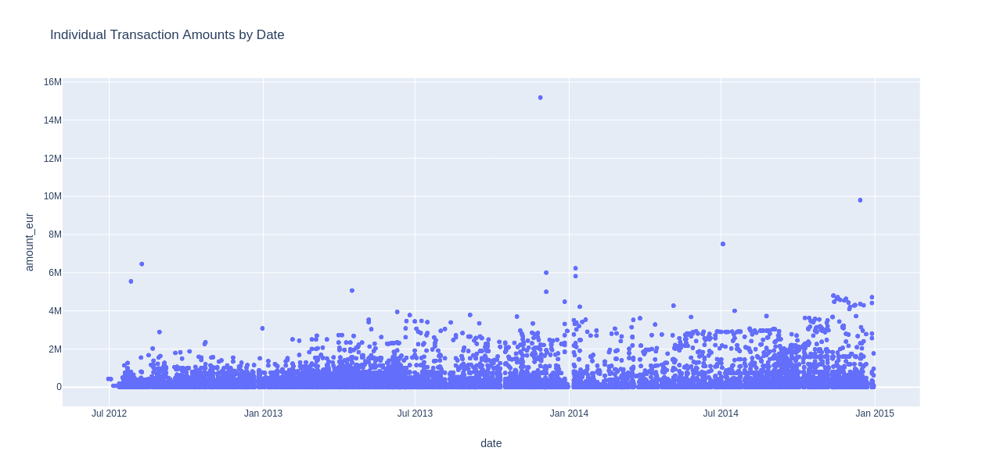

In [87]:
fig = px.scatter(dedupe_df, x='date', y='amount_eur', hover_data=['amount_orig_currency', 'payer_bank_country', 'payer_name']
          , title='Individual Transaction Amounts by Date')
fig.show()
# Get a sense of the transaction amount by date

The Securo 15mm stands out above the rest when plotting everything. If you zoom in to the 0 - 1mm range, you notice some horizontal clusters of points, which indicate repeated values that occur within a short period of time. Counting the number of occurences of transaction amounts gives you the most frequent amounts overall, but even more compelling are the visual clusters. 

In [88]:
dedupe_df.dropna().groupby('amount_eur')['id'].count().sort_values(ascending=False).head(10)

amount_eur
20000.0     47
30000.0     32
10000.0     31
50000.0     29
100000.0    26
36918.5     24
200000.0    24
500000.0    23
300000.0    21
25000.0     20
Name: id, dtype: int64

Here's one cluster I noticed where the transaction amount is 369185 euros. Polux and Hilux paid out a convenient 500k USD to a mixture of companies, making payments in quick succession sometimes to the same beneficiary, and only in the month of November 2013. 

In [89]:
dedupe_df[dedupe_df['amount_eur'] == 369185].T # 500k usd

,11161,11190,11254,11297,11341,11566,11599,11600,11717
amount_eur,369185,369185,369185,369185,369185,369185,369185,369185,369185
amount_orig,-500000,-500000,-500000,-500000,-500000,-500000,-500000,-500000,-500000
amount_orig_currency,USD,USD,USD,USD,USD,USD,USD,USD,USD
amount_usd,500000,500000,500000,500000,500000,500000,500000,500000,500000
beneficiary_account,LV30AIZK0001140105520,LV30AIZK0001140105520,333505590009,333513010005,40702840960050201574,333514840009,TR350020600129021207540101,TR350020600129021207540101,333516220009
beneficiary_bank_country,LV,LV,33,33,40,33,TR,TR,33
beneficiary_core,False,False,False,False,False,False,False,False,True
beneficiary_jurisdiction,VG,VG,GB,GB,US,GB,TR,TR,GB
beneficiary_name,UPFIELD EXPRESS INC,UPFIELD EXPRESS INC,KG COMMERCE LLP,MOLONEY TRADE LLP,AGRO-TECHNIC LLC,DATEMILE ALLIANCE LLP,ILHAM IBRAHIMOV,ILHAM IBRAHIMOV,POLUX MANAGEMENT LLP
beneficiary_name_norm,UPFIELD EXPRESS INC,UPFIELD EXPRESS INC,KG COMMERCE LLP,MOLONEY TRADE LLP,AGRO-TECHNIC LLC,DATEMILE ALLIANCE LLP,ILHAM IBRAHIMOV,ILHAM IBRAHIMOV,POLUX MANAGEMENT LP


<a id='time'></a>
### Look further into time between transactions

In [90]:
dedupe_df['time_between_trans'] = dedupe_df.groupby(['beneficiary_name_norm', 'payer_name_norm'])['date']\
                                            .diff().dt.days

/home/douglas/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [91]:
# Group pairs of entities
pairs = dedupe_df.groupby(['beneficiary_name_norm', 'payer_name_norm'])\
            .agg({'amount_eur': 'mean', 'id': 'count', 'time_between_trans':'mean'})\
            .rename({'amount_eur': 'avg_amount_eur', 'id': 'num_trans'}, axis=1)\
            .reset_index()\
            .sort_values('num_trans', ascending=False)
pairs.head()

,beneficiary_name_norm,payer_name_norm,avg_amount_eur,num_trans,time_between_trans
1400,HILUX SERVICES LP,BAKTELEKOM MMC,2.147843e+06,437,1.314220
1030,FABERLEX LP,HILUX SERVICES LP,4.520675e+05,321,1.484375
1416,HILUX SERVICES LP,FABERLEX LP,5.900774e+05,218,1.926267
1795,KG COMMERCE LLP,LCM ALLIANCE LLP,2.441143e+05,205,1.710784
433,BONINVEST LLP,LCM ALLIANCE LLP,2.790242e+05,186,0.891892


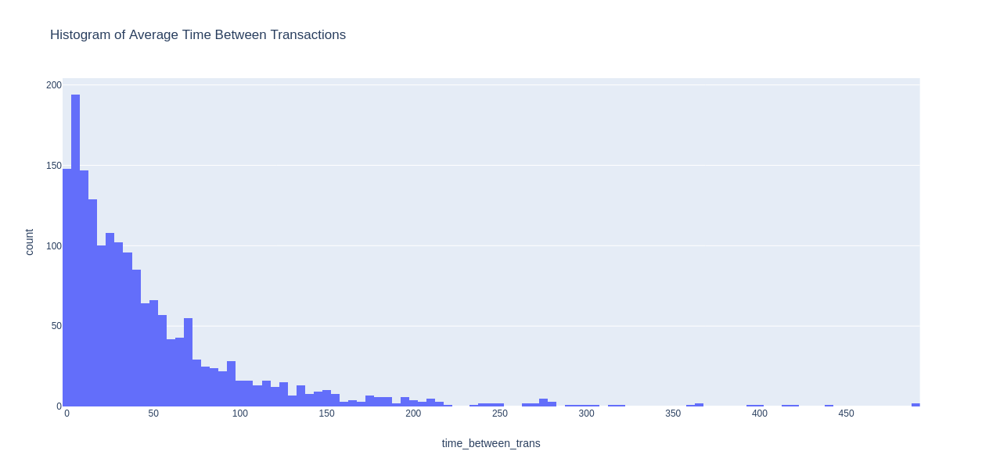

In [92]:
px.histogram(pairs, x='time_between_trans', title='Histogram of Average Time Between Transactions')

In [93]:
# 5th percentile 
np.percentile(pairs['time_between_trans'].dropna(), 5)

1.0

This means these pairs average less than a day between transactions! In a normal business context, it's unusual to pay twice or more on the same day

In [94]:
pairs[pairs['time_between_trans'] < 1].head(10)

,beneficiary_name_norm,payer_name_norm,avg_amount_eur,num_trans,time_between_trans
433,BONINVEST LLP,LCM ALLIANCE LLP,2.790242e+05,186,0.891892
1543,ILHAM IBRAHIMOV,POLUX MANAGEMENT LP,5.611612e+05,10,0.888889
2978,POLUX MANAGEMENT LP,SDT TRADE LLP,1.443763e+06,5,0.500000
3188,SANDLER EXPERT LIMITED,POLUX MANAGEMENT LP,7.570010e+05,3,0.000000
3147,S+H BAUBETREUUNGS GMBH,METASTAR INVEST LLP,2.363333e+04,3,0.500000
1259,GR BERATUNG GMBH,LCM ALLIANCE LLP,6.716667e+02,3,0.000000
691,CORTEM GROUP,LCM ALLIANCE LLP,1.384949e+04,3,0.000000
2537,MM ORBITA LTD LLC,LCM ALLIANCE LLP,5.851293e+05,3,0.000000
3754,VIDENTI,METASTAR INVEST LLP,2.899833e+02,3,0.000000
1633,INTERNATIONAL COMMUNITY SCHOOL ICS,POLUX MANAGEMENT LP,1.251490e+03,2,0.000000


In [95]:
def pair_trans_details(df, beneficiary, payer):
    """Get full tansaction details between a pair of entities
    df: transactions dataframe
    beneficiary: str, beneficiary_name_norm
    payer: str, payer_name_norm
    Returns transposed filtered df """
    bene_mask = df['beneficiary_name_norm'] == beneficiary
    payer_mask = df['payer_name_norm'] == payer
    return df[bene_mask & payer_mask].T

In [96]:
# Buying mercedes benz example - 3 payments in 2 days
pair_trans_details(dedupe_df, 'S+H BAUBETREUUNGS GMBH', 'METASTAR INVEST LLP')

,9819,9871,9872
amount_eur,15000,28000,27900
amount_orig,-15000,-28000,-27900
amount_orig_currency,EUR,EUR,EUR
amount_usd,19830,37016,36884
beneficiary_account,DE03600501010008054979,DE03600501010008054979,DE03600501010008054979
beneficiary_bank_country,DE,DE,DE
beneficiary_core,False,False,False
beneficiary_jurisdiction,DE,DE,DE
beneficiary_name,S+H BAUBETREUUNGS GMBH,S+H BAUBETREUUNGS GMBH,S+H BAUBETREUUNGS GMBH
beneficiary_name_norm,S+H BAUBETREUUNGS GMBH,S+H BAUBETREUUNGS GMBH,S+H BAUBETREUUNGS GMBH


<a id='amount'></a>
### Transaction Amounts

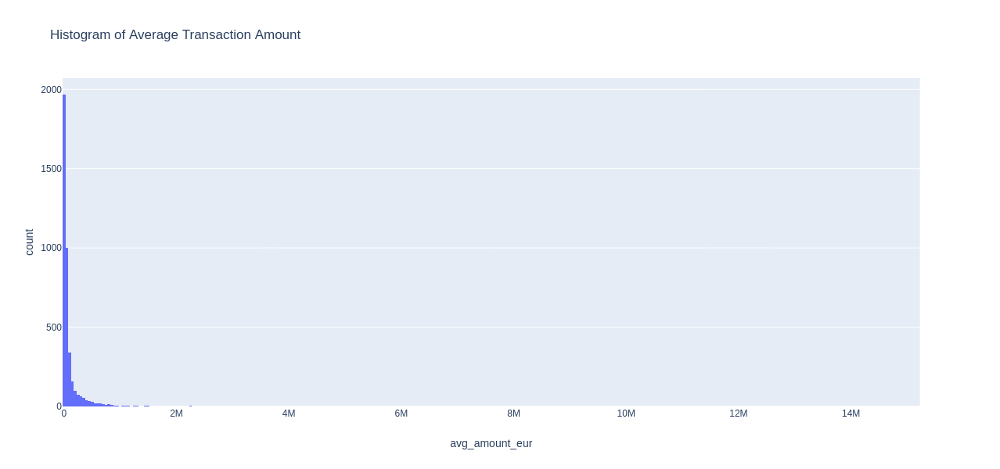

In [97]:
px.histogram(pairs, x='avg_amount_eur', title='Histogram of Average Transaction Amount')

In [98]:
# 95th percetile of transactions are under 450k euros
np.percentile(pairs['avg_amount_eur'], 95)

453199.2750233643

In [99]:
# but these are in the millions 
pairs[pairs['num_trans'] > 1].sort_values('avg_amount_eur', ascending=False).head()

,beneficiary_name_norm,payer_name_norm,avg_amount_eur,num_trans,time_between_trans
1399,HILUX SERVICES LP,ARASH MEDICAL PRODUCTION LTD,3.752200e+06,5,84.000000
2133,LCM ALLIANCE LLP,ZAMANTINI LIMITED,2.200968e+06,5,22.250000
1400,HILUX SERVICES LP,BAKTELEKOM MMC,2.147843e+06,437,1.314220
153,AMBERLOT INVEST LP,HILUX SERVICES LP,2.100000e+06,3,1.000000
2966,POLUX MANAGEMENT LP,BAKTELEKOM MMC,1.727983e+06,93,1.913043


In [100]:
# high value transactions example
pair_trans_details(dedupe_df, 'POLUX MANAGEMENT LP', 'BAKTELEKOM MMC')

,7012,7296,7384,7451,7453,7634,7721,7804,7809,8001,...,11290,11291,11332,11334,11356,11381,11481,11507,11636,11666
amount_eur,163160,1.84555e+06,1.12155e+06,1.49414e+06,2.349e+06,2.30935e+06,620144,404870,1.15465e+06,770987,...,1.0861e+06,1.99356e+06,199320,1.6635e+06,149853,609850,3.33665e+06,2.01497e+06,2.61822e+06,641600
amount_orig,211952,2.39744e+06,1.45694e+06,1.94094e+06,3.05144e+06,2.99994e+06,805592,525942,1.49994e+06,1.00154e+06,...,1.47094e+06,2.69994e+06,269946,2.25294e+06,202952,825942,4.51894e+06,2.72894e+06,3.54594e+06,868942
amount_orig_currency,USD,USD,USD,USD,USD,USD,USD,USD,USD,USD,...,USD,USD,USD,USD,USD,USD,USD,USD,USD,USD
amount_usd,211952,2397442,1456942,1940942,3051442,2999942,805592,525942,1499942,1001542,...,1470942,2699942,269947,2252942,202952,825942,4518942,2728942,3545942,868942
beneficiary_account,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,...,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009,EE35 3300 3335 1622 0009
beneficiary_bank_country,EE,EE,EE,EE,EE,EE,EE,EE,EE,EE,...,EE,EE,EE,EE,EE,EE,EE,EE,EE,EE
beneficiary_core,True,True,True,True,True,True,True,True,True,True,...,True,True,True,True,True,True,True,True,True,True
beneficiary_jurisdiction,GB,GB,GB,GB,GB,GB,GB,GB,GB,GB,...,GB,GB,GB,GB,GB,GB,GB,GB,GB,GB
beneficiary_name,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,...,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP
beneficiary_name_norm,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,...,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP,POLUX MANAGEMENT LP


In [101]:
# pair_trans_details(dedupe_df, 'POLUX MANAGEMENT LP', 'BAKTELEKOM MMC').T['purpose_type'].value_counts().plot(kind='bar')

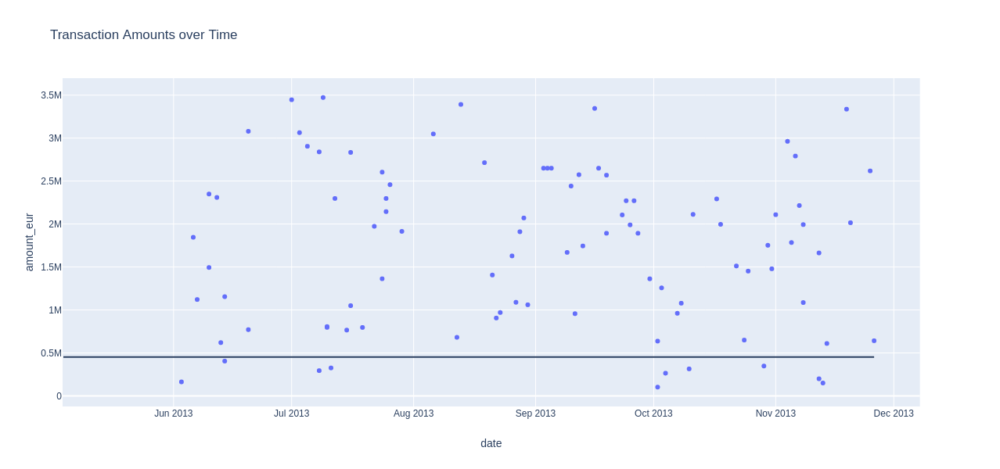

In [102]:
# Nearly all transactions between this pair are above the 95th percentile 
# Does this pair of entities have good reason to be transferring funds so frequently at such high quantities?
polux_baktele = pair_trans_details(dedupe_df, 'POLUX MANAGEMENT LP', 'BAKTELEKOM MMC').T
fig = px.scatter(polux_baktele, x='date', y='amount_eur'
              , title='Transaction Amounts over Time')
fig.layout.update({'shapes': [{'type': 'line',
                             'x0': polux_baktele['date'].min() - datetime.timedelta(days=30),
                             'y0': np.percentile(pairs['avg_amount_eur'], 95)
                             , 'x1':polux_baktele['date'].max()
                             , 'y1': np.percentile(pairs['avg_amount_eur'], 95)}]})
# fig.add_scatter(x=polux_baktele['date'], y= np.repeat(np.percentile(pairs['avg_amount_eur'], 95), len(polux_baktele)), connectgaps=True)
fig.show()